# Universal differential equation for the SEIR model

In this notebook, we want to regularize the UDE training to prevent the neural network from absorbing the effect of the mechanistic model, thus ensuring that the mechanistic parameter can be correctly estimated.

In [1]:
# SciML Tools
using OrdinaryDiffEq, SciMLSensitivity, Optimization, OptimizationOptimisers, OptimizationOptimJL

# Standard Libraries
using LinearAlgebra, Statistics, Random, Distributions

# External Libraries
using ComponentArrays, Lux, Zygote, Plots, StableRNGs
gr()

# Set a random seed for reproducible behavior
rng = StableRNG(10);

### 1. Define the SEIR model and sample one data set

In [2]:
function seir!(du, u, p, t)
    α, β, γ, N = p
    du[1] = -β*u[1]*u[3]/N
    du[2] = β*u[1]*u[3]/N - α*u[2]
    du[3] = α*u[2] - γ*u[3]
    du[4] = γ*u[3]
end

p_ode = [0.3, 1.0, 0.4, 1.0]
u0 = [0.995, 0.004, 0.001, 0.0]
tspan = (0.0, 50.0);

prob = ODEProblem(seir!, u0, tspan, p_ode)
sol = solve(prob, Tsit5(), abstol = 1e-12, reltol = 1e-12, saveat = 1.0);

In [3]:
t = sol.t
X = Array(sol)
dist = LogNormal(0, 0.05)
noise = rand(rng, dist, size(X[:, begin:5:end]))
X_noisy = noise .* X[:, begin:5:end];

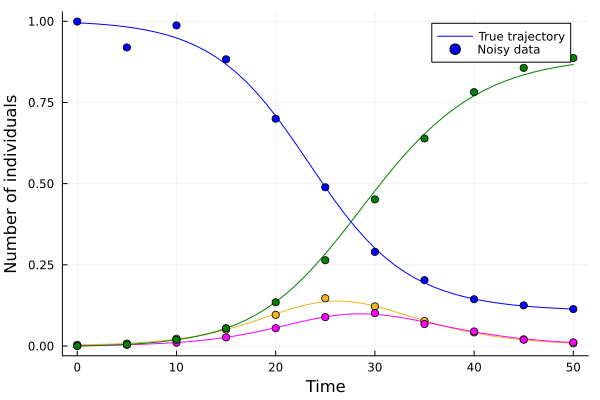

In [4]:
plot(t, X', xlabel = "Time", ylabel = "Number of individuals", color = [:blue :goldenrod2 :magenta :green], 
     label = ["True trajectory" nothing nothing nothing])
scatter!(t[begin:5:end], X_noisy', color = [:blue :goldenrod2 :magenta :green], 
     label = ["Noisy data" nothing nothing nothing])

### 2. Set up the UDE

We set up our UDE by first defining the NN component and then the hybrid model $u'=f(u, \gamma)+\text{NN}(u, \theta)$.

In [5]:
# Define activation function
rbf(x) = exp.(-(x .^ 2))

# Multi-layer feed-forward neural network
model = Chain(Dense(4, 8, rbf), Dense(8, 8, rbf), Dense(8, 8, rbf), Dense(8, 4))

# Get initial parameters and state variables of the model
θ_init, st = Lux.setup(rng, model);

In [6]:
# Define the hybrid model
function ude_dynamics!(du, u, p, t)
    nn = Lux.apply(model, u, p.nn, st)[1]    
    du[1] = nn[1]
    du[2] = nn[2] 
    du[3] = -p.γ*u[3] + nn[3] 
    du[4] = p.γ*u[3] + nn[4]
end

γ_init = 0.8
p_init = (nn = θ_init, γ = γ_init)
p_init = ComponentVector(p_init)
prob_ude = ODEProblem(ude_dynamics!, u0, tspan, p_init);

### 3. Set up the training

In [7]:
function predict(p, saveat = t[begin:5:end])   # p contains NN parameters θ and mechanistic parameter γ of the ODE
    _prob = remake(prob_ude, p = p)
    Array(solve(_prob, Tsit5(), abstol = 1e-6, reltol = 1e-6, saveat = saveat,
                sensealg = QuadratureAdjoint(autojacvec=ReverseDiffVJP(true))))
end;

\$ \sum_i\int_0^T|\text{NN}_i(x(t),\theta)| dt $ 

\$ \approx\sum_{n=0}^{N-1}\sum_i(t_{n+1}-t_n)|\text{NN}_i(x(t_n),\theta)|$

In [8]:
function loss(x, p)   # x: optimized variable, p: parametrization of the objective
    if p.reg == nothing
        X̂ = predict(x)
        mean(abs2, X_noisy .- X̂)   
    elseif p.reg == "L2 θ"
        X̂ = predict(x)
        mean(abs2, X_noisy .- X̂) + p.ω * norm(x.nn)
    elseif p.reg == "Integral"
        X̂_fine = predict(x, t)
        X̂ = X̂_fine[:, begin:5:end]
        mean(abs2, X_noisy .- X̂) + p.ω * norm(Lux.apply(model, X̂_fine[:, begin:end-1], x.nn, st)[1], 1)
    end
end;

### 4. Method to train the UDE using different regularization techniques

In [9]:
function train_ude(reg, ω, adam_epochs = 7500, bfgs_epochs = 2500, print_loss = false)
    # Set up histories for loss and parameter estimates
    losses = Float64[]
    γ_hist = Float64[]
    function callback(p, l)
        push!(losses, l)
        push!(γ_hist, p.γ)
        if print_loss
            n_iter = length(losses)
            if n_iter % 250 == 0   
                println("Loss after $(n_iter) iterations: $(losses[end])")
            end
        end
        return false
    end
    
    # Set up optimization problem
    adtype = AutoZygote()
    optf = OptimizationFunction(loss, adtype)
    optprob = OptimizationProblem(optf, p_init, (reg = reg, ω = ω))
    
    # Hybrid training procedure combining Adam and BFGS
    if print_loss
        println("Using Adam:")
    end
    res1 = solve(optprob, ADAM(), callback = callback, maxiters = adam_epochs)
    optprob2 = OptimizationProblem(optf, res1.u, (reg = reg, ω = ω))
    if print_loss
        println("Using BFGS:")
    end
    res2 = solve(optprob2, LBFGS(), callback = callback, maxiters = bfgs_epochs)
    p_trained = res2.u;
    
    return [reg, ω, adam_epochs, losses, γ_hist, p_trained]    
end;    

### 5. Method to visualize the results

In [10]:
function visualize(result)  
    # Unpack result
    reg, ω, adam_epochs, losses, γ_hist, p_trained = result    
    
    # Print type of regularization and estimated mechanistic parameter
    println("Regularization: $(reg), ω: $(ω)")
    println("Estimate of γ: $(p_trained.γ)")
    
    # Convergence plot
    p1 = plot(1:adam_epochs, losses[1:adam_epochs], yaxis=:log10, xlabel="Iterations", ylabel="Loss", label="ADAM",
              color=:blue)
    plot!(adam_epochs+1:length(losses), losses[adam_epochs+1:end], yaxis=:log10, label="BFGS", color=:red)
    
    # Parameter estimate plot
    p2 = plot(1:adam_epochs, γ_hist[1:adam_epochs], xlabel="Iterations", ylabel="Estimated γ", label="ADAM", 
              color=:blue)
    plot!(adam_epochs+1:length(γ_hist), γ_hist[adam_epochs+1:end], label="BFGS", color=:red)
    plot!(1:length(γ_hist), p_ode[3]*ones(length(γ_hist)), linestyle = :dash, label="Ground truth", color=:grey10)
    
    # Data fit
    X̂ = predict(p_trained, t)
    p3 = plot(t, X̂', xlabel = "Time", ylabel = "Number of individuals", color = [:blue :goldenrod2 :magenta :green],
              label = ["UDE approximation" nothing nothing nothing])
    scatter!(t[begin:5:end], X_noisy', color = [:blue :goldenrod2 :magenta :green], 
             label = ["Noisy data" nothing nothing nothing])
    
    # Approximation of true trajectory
    p4 = plot(t, X', xlabel = "Time", ylabel = "Number of individuals", color = [:blue :goldenrod2 :magenta :green], 
              label = ["True trajectory" nothing nothing nothing])
    plot!(t, X̂', linestyle = :dash, color = [:blue :goldenrod2 :magenta :green], 
          label = ["UDE approximation" nothing nothing nothing])
    
    # True residual dynamics (i.e. interactions of predictors) along the true trajectory
    α, β, γ, N = p_ode
    dynamics_true = [-β/N * (X[1,:] .* X[3,:])'; β/N * (X[1,:] .* X[3,:])' - α * X[2,:]'; α * X[2,:]'; 
                     zeros(length(t))'] 
    # Neural network guess along the true trajectory
    dynamics_nn = Lux.apply(model, X, p_trained.nn, st)[1]
    # Compare true and learned residual dynamics
    p5 = plot(t, dynamics_true', xlabel = "Time", ylabel = "Residual dynamics", 
              color = [:blue :goldenrod2 :magenta :green], label = ["True" nothing nothing nothing])
    plot!(t, dynamics_nn', color = [:blue :goldenrod2 :magenta :green], linestyle = :dash, 
          label = ["NN(S,E,I,R)" nothing nothing nothing])
    
    # Combined plot
    plot(p1, p2, p3, p4, p5, size=(800,900), layout=(3,2))
end;

### 6. Train UDEs and compare results

In [11]:
result_no_reg = train_ude(nothing, nothing);

Regularization: nothing, ω: nothing
Estimate of γ: 1.0050391077235217


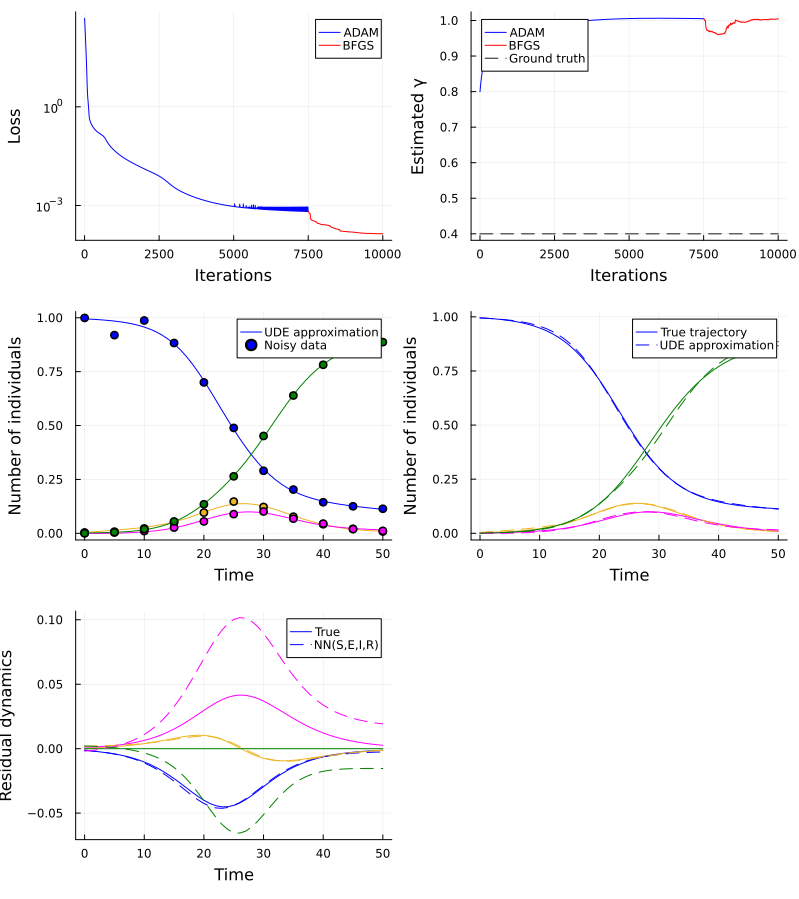

In [12]:
visualize(result_no_reg)

In [13]:
results_L2_θ = []

for ω in [0.01, 0.005, 0.001, 0.0005, 0.0001]
    push!(results_L2_θ, train_ude("L2 θ", ω)) 
end;

Regularization: L2 θ, ω: 0.01
Estimate of γ: 0.25412077092172547


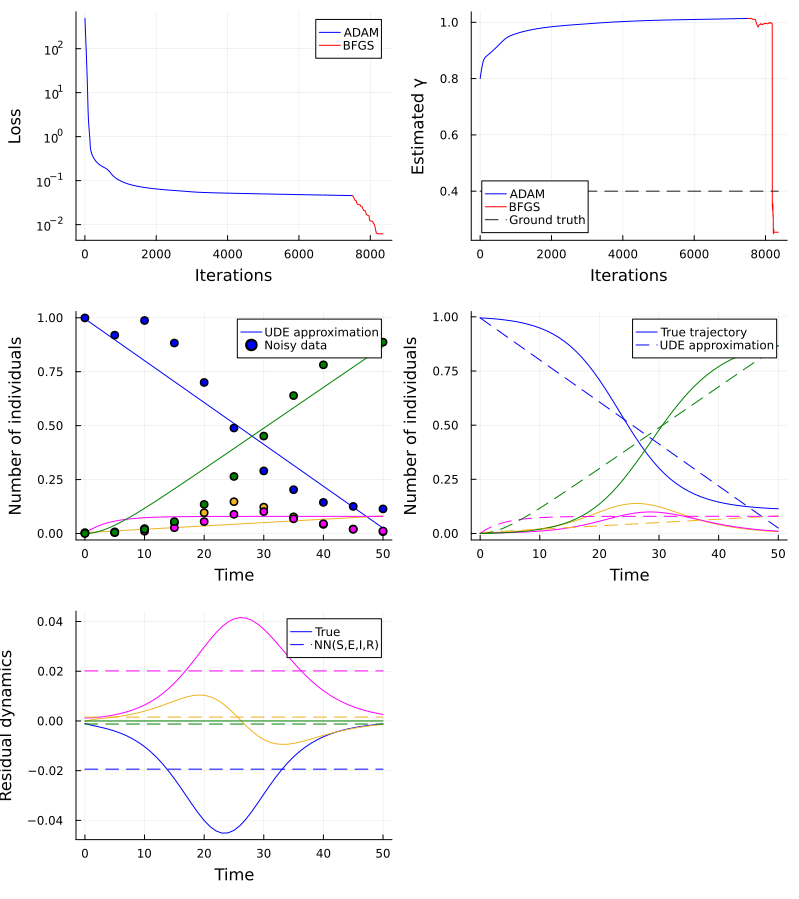

In [14]:
visualize(results_L2_θ[1])

Regularization: L2 θ, ω: 0.005
Estimate of γ: 0.2736179257352488


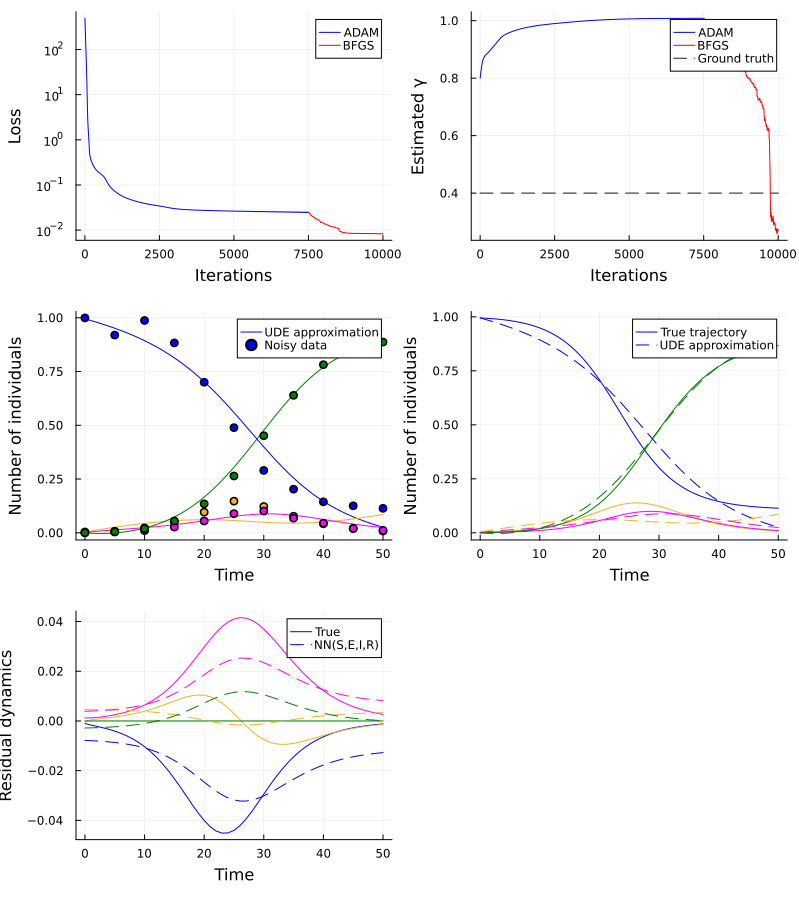

In [15]:
visualize(results_L2_θ[2])

Regularization: L2 θ, ω: 0.001
Estimate of γ: 0.4113524464698552


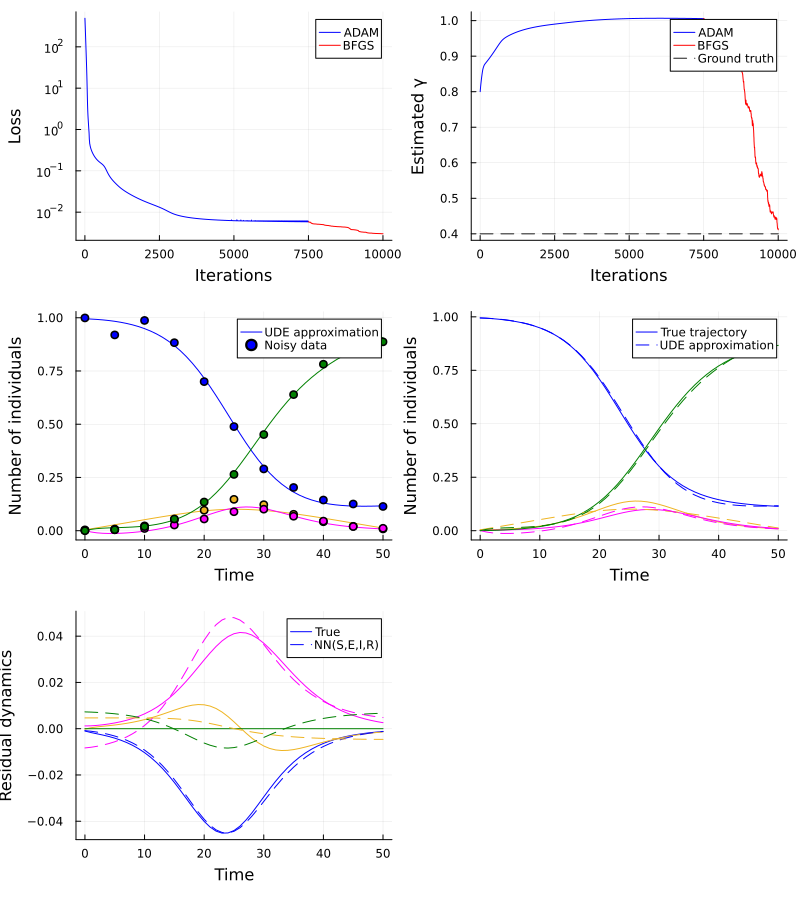

In [16]:
visualize(results_L2_θ[3])

Regularization: L2 θ, ω: 0.0005
Estimate of γ: 0.9193403466657152


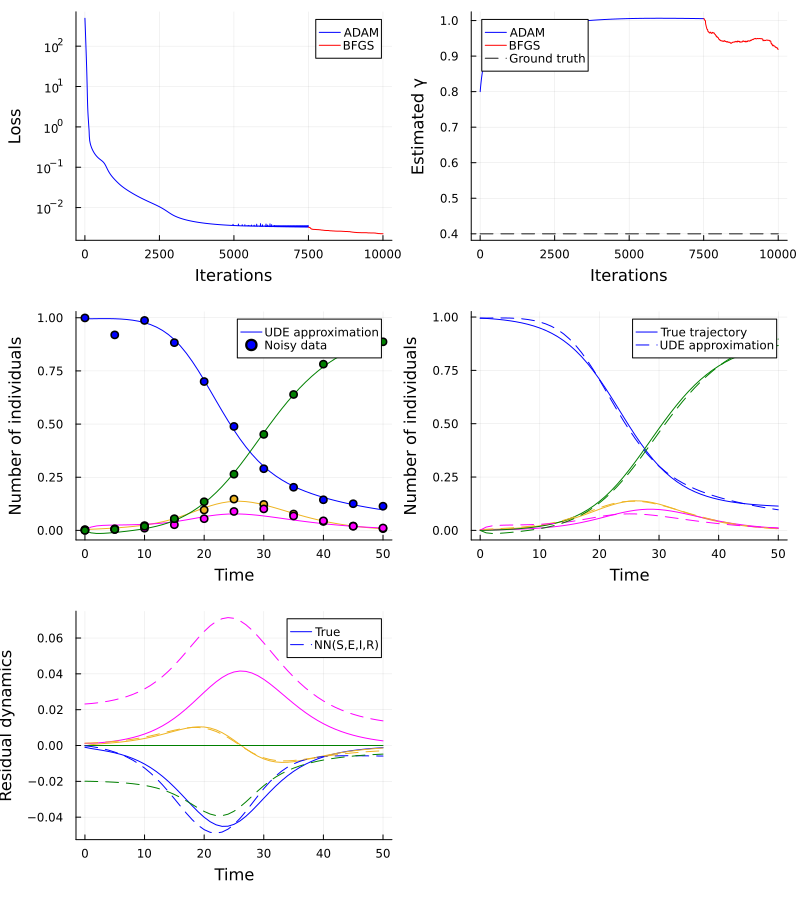

In [17]:
visualize(results_L2_θ[4])

Regularization: L2 θ, ω: 0.0001
Estimate of γ: 1.0460643135999268


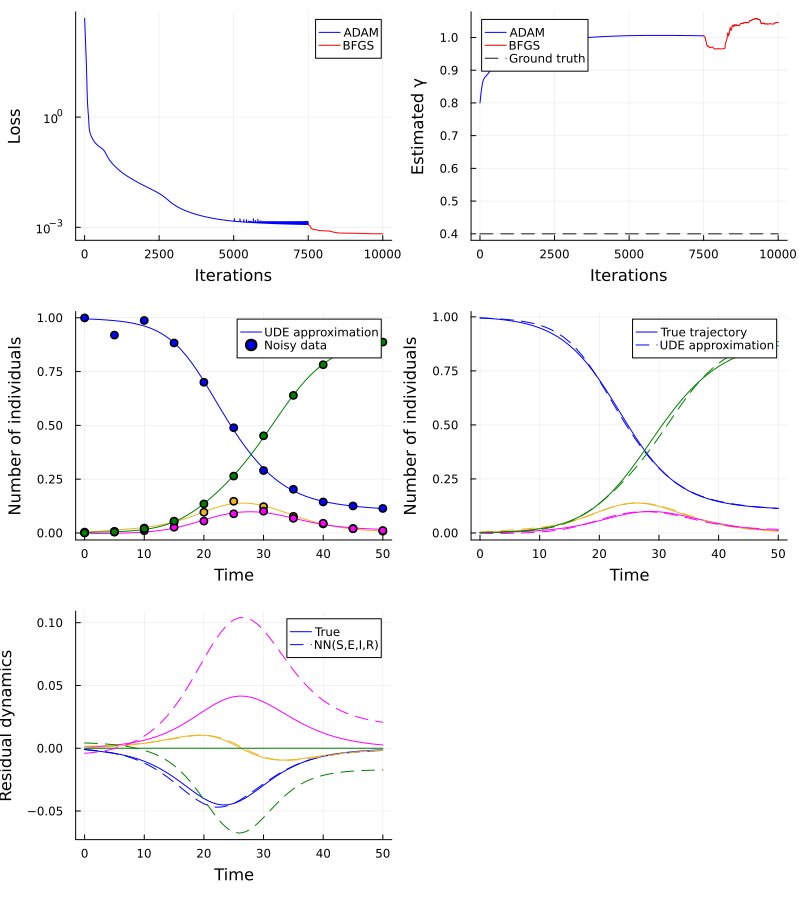

In [18]:
visualize(results_L2_θ[5])

In [19]:
results_integral = []

for ω in [0.01, 0.005, 0.001, 0.0005, 0.0001]
    push!(results_integral, train_ude("Integral", ω)) 
end;

Regularization: Integral, ω: 0.01
Estimate of γ: 0.8802443566497126


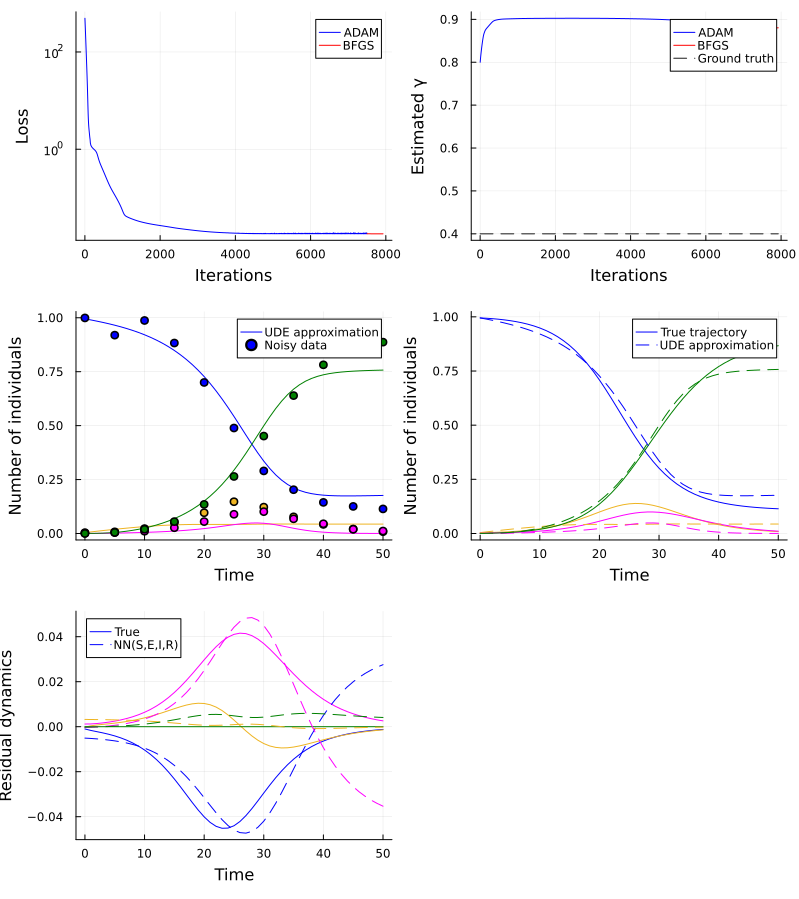

In [20]:
visualize(results_integral[1])

Regularization: Integral, ω: 0.005
Estimate of γ: 0.38638226096879946


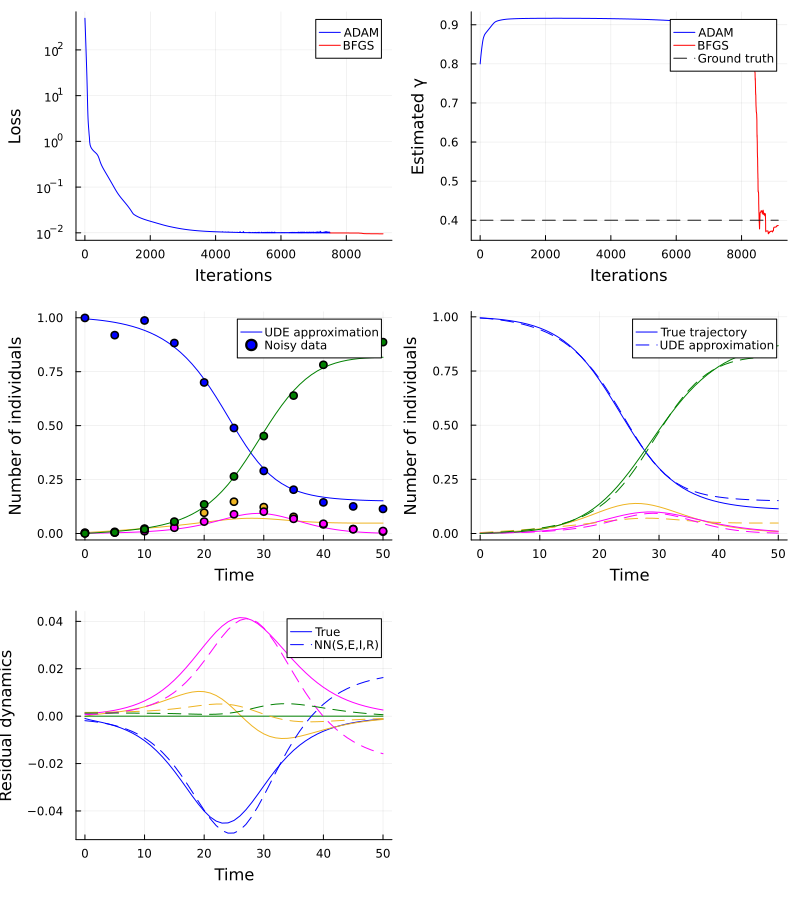

In [21]:
visualize(results_integral[2])

Regularization: Integral, ω: 0.001
Estimate of γ: 0.34258064586523845


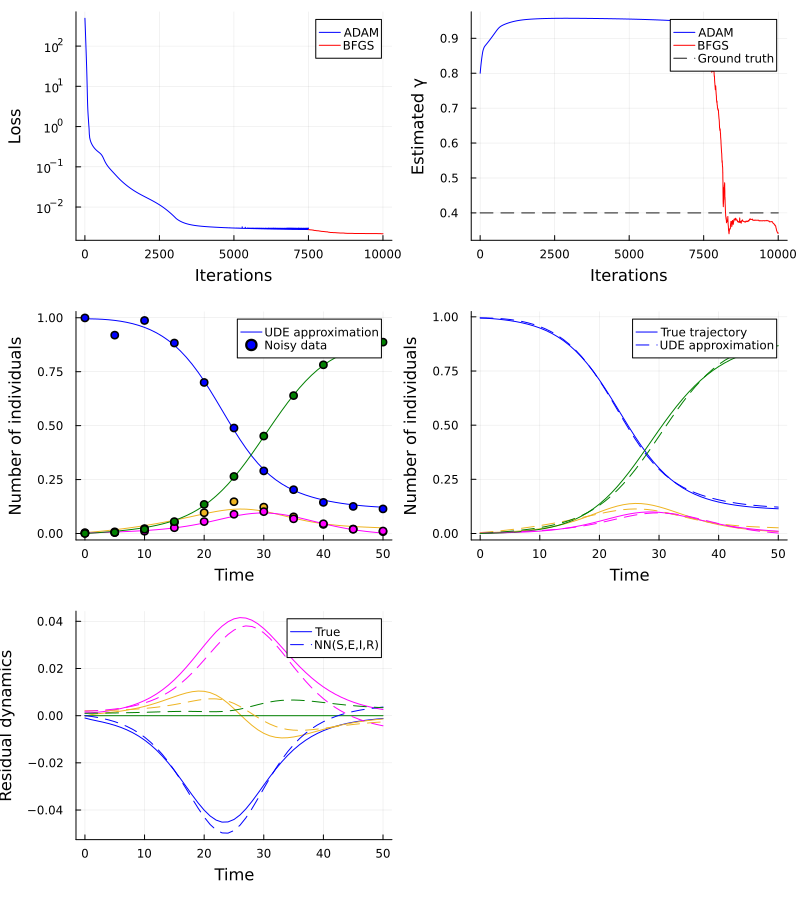

In [22]:
visualize(results_integral[3])

Regularization: Integral, ω: 0.0005
Estimate of γ: 0.24637988187043053


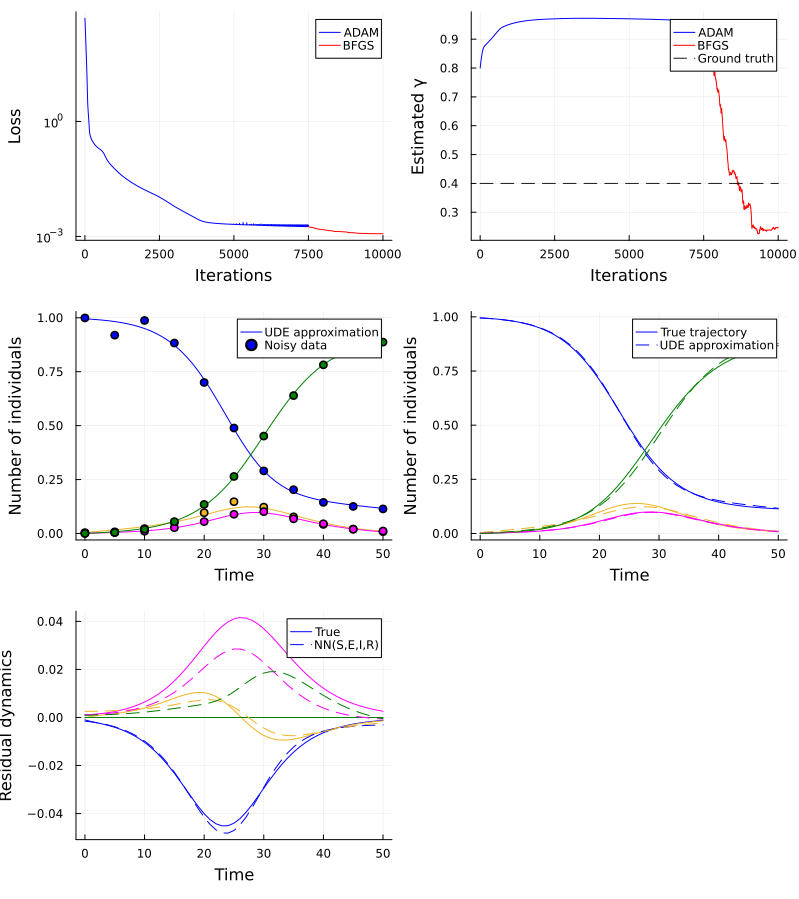

In [23]:
visualize(results_integral[4])

Regularization: Integral, ω: 0.0001
Estimate of γ: 0.5692342382388313


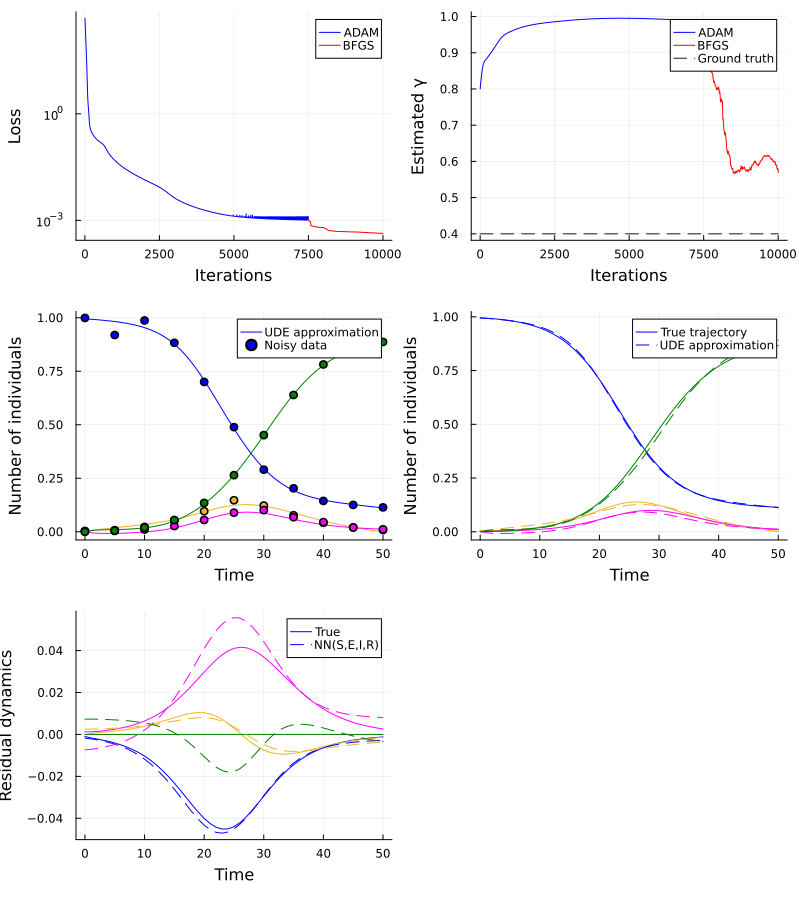

In [24]:
visualize(results_integral[5])